## Part 7a: Predictive Modeling with CausalImpact
---
In this section, we employ the tools of predictive analytics to measure short- and long-term impact of the marketing campaign on user metrics by using CausalImpact library, which is Google's Causal Impact Algorithm implemented on top of TensorFlow Probability.

### Table of Contents
- [Imports, global parameters, functions](#section-1)
- [Marketing campaign: analysis of metrics with CasualImpact](#section-2)



<a id="section-1"></a>
### Imports, global parameters, functions
---

In [1]:
# 1. Import Tensorflow in a way that silences the long lines of WARNINGS
# source and credits: https://weepingfish.github.io/2020/07/22/0722-suppress-tensorflow-warnings/ 
def import_tensorflow():
    # Filter tensorflow version warnings
    import os
    # https://stackoverflow.com/questions/40426502/is-there-a-way-to-suppress-the-messages-tensorflow-prints/40426709
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # or any {'0', '1', '2'}
    import warnings
    # https://stackoverflow.com/questions/15777951/how-to-suppress-pandas-future-warning
    warnings.simplefilter(action='ignore', category=FutureWarning)
    warnings.simplefilter(action='ignore', category=Warning)
    import tensorflow as tf
    tf.get_logger().setLevel('INFO')
    tf.autograph.set_verbosity(0)
    import logging
    tf.get_logger().setLevel(logging.ERROR)
    return tf

tf = import_tensorflow()    


In [2]:
# 2. Then start with the imports we would need

import numpy as np
import pandas as pd
import swifter # applies any function to a pandas df or series faster
import pandahouse as ph # Connect with clickhouse DB

import tensorflow_probability as tfp
from causalimpact import CausalImpact

from statsmodels.tsa.seasonal import seasonal_decompose

import matplotlib.pyplot as plt # visualization
import seaborn as sns


In [3]:
# set the connection with the db
CONNECTION = {'host': 'https://clickhouse.lab.karpov.courses',
                      'database':'simulator_20230720',
                      'user':'student', 
                      'password':'dpo_python_2020'
                     }


In [4]:
# Create a function that plots a lineplot on a given grid
def lineplotter(
    data: pd.DataFrame,
    x: str,
    y: str,
    ax,
    hue: str = None,
    title: str = None,
    xlabel: str = None,
    ylabel: str = None,
    ) -> None:
    """
    Plots a lineplot for the given dataframe (table) on the given axis (ax)
    """
    fontsize = 15
    labelsize = 12
    
    # Check the label values and infer those not set from the table:
    if not ylabel:
        ylabel = y
    if not xlabel:
        xlabel = x
    if not title:
        title = f"{ylabel} vs {xlabel}"
        
    # Plot the line plot
    sns.lineplot(
        data=data,
        x=x, 
        y=y, 
        hue=hue,
        ax=ax,
        linewidth=2
    )
    
    ax.set_title(title, fontsize=fontsize)
    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_ylabel(ylabel, fontsize=fontsize)
    
    ax.legend(fontsize=fontsize)
    
#     # now move X axis tick labels closer to the X axis:
#     # Get the current tick labels
#     tick_labels = ax.get_xticklabels()

#     # Set the padding/offset for the tick labels (adjust this value as needed)
#     padding = 1 * SCALE
#     for label in tick_labels:
#         label.set_y(label.get_position()[1] + padding)

#     # Create new tick labels with right alignment
#     new_tick_labels = [label.get_text().ljust(25) for label in tick_labels]

#     # Set the new tick labels
#     ax.set_xticklabels(new_tick_labels)
    ax.tick_params(axis='x', rotation=45, labelsize=labelsize)
    ax.tick_params(axis='y', rotation=0, labelsize=labelsize)

In [5]:
# Create a function that plots results of statsmodels'
# seasonsal decompose in a nice manner
def decompose_plotter(decomposed_obj):
    
    fig = decomposed_obj.plot()
    fig.axes[3].lines[0].set(markersize=3);
    fig.set_size_inches((12, 9))
    fig.tight_layout()
    plt.show()

In [6]:
# Create a function that plots a retention heatmap on a given grid
def heatmapper(
    table: pd.DataFrame, 
    ax,
    title: str = None,
    xlabel: str = None,
    ylabel: str = None
    ) -> None:
    """
    Plots a heatmap for the given pivot table (table) on the given axis (ax)
    """
    
    # Check the label values and infer those not set from the table:
    if not ylabel:
        ylabel = table.columns.name
    if not xlabel:
        xlabel = table.index.name
    if not title:
        title = f"{ylabel} vs {xlabel}"
    
    fontsize = 12
    labelsize = 12
    # Plot the heatmap of the retention of ad-sourced users
    sns.heatmap(table, annot=True, cmap='coolwarm', fmt='.0f', cbar=False, ax=ax)
    ax.set_title(title, fontsize=fontsize)
    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_ylabel(ylabel, fontsize=fontsize)
    
    # now move X axis tick labels closer to the X axis:
    # Get the current tick labels
    tick_labels = ax.get_xticklabels()

    # # Set the padding/offset for the tick labels (adjust this value as needed)
    # padding = 0.5 * SCALE
    # for label in tick_labels:
    #     label.set_y(label.get_position()[1] + padding)

    # Create new tick labels with right alignment
    new_tick_labels = [label.get_text().ljust(50) for label in tick_labels]

    # Set the new tick labels
    # ax.set_xticklabels(new_tick_labels)
    ax.tick_params(axis='x', rotation=45, labelsize=labelsize)
    ax.tick_params(axis='y', rotation=0, labelsize=labelsize)

In [7]:
def ci_plotter(
    ci,
    ylabel
):
    """
    plot a result of CasualImpact modeling in an adjustable way (custom labels and font sizes:
    top plot: predicted VS observed time series
    middle plot: point effects 
    bottom plot: cumulative effect
    Input:
    ci - object created at CasualImpact modeling
    ylabel - respective label
    SCALE - scaling factor for sizes
    """
    # call a plot method of CasualImpact object, 
    # set show to 'False' to allow changing the plot settings
    ci.plot(show=False)
    
    # get a canvas and axes of the plot
    fig = plt.gcf()
    axes = fig.get_axes()

    # adjust canvas size and font size
    fig.set_size_inches(12, 15)
    labelsize = 12
    fontsize = 12
    
    # adjust each ax object
    for ax, plot_type in zip(axes, ['Overview', 'Point effects', 'Cumulative effect']):

        ax.legend(fontsize=fontsize)
        
        ax.tick_params(axis='x', rotation=45, labelsize=labelsize)
        ax.tick_params(axis='y', rotation=0, labelsize=labelsize)

        ax.set_title(f'Forecasted {ylabel} per hour: {plot_type}', fontsize=fontsize)
        ax.set_xlabel('Time', fontsize=fontsize)
        ax.set_ylabel(f'Hourly {ylabel}', fontsize=fontsize)
        
        # if Y axis ticks labels have scientific format,
        # this would adjust the size of the multiplier (e.g. '1e6')
        ax.yaxis.offsetText.set_fontsize(fontsize)

    plt.tight_layout(h_pad=10)
    

In [8]:
# make a simple generator which iterates over df column`s names:
def column_gen(columns):
    for column in columns:
        yield column

<a id="section-2"></a>
### Marketing campaign: analysis of metrics with Casualmpact
---
Our team of marketers decided to organize a campaign in the news feed: participants must make a post where they share an interesting fact about themselves and publish it with a hashtag. The three posts that receive the most likes will win prizes.

The flash mob took place from 2023-07-14 to 2023-07-20. Your task as an analyst is to evaluate the effectiveness of this event.

Questions:
  - Which metrics were affected and how by the campaign?
  - has the metric analyzed indeed changed?
  - Was there any long-term effect of this campaign?
  
To do:
  - Propose which metrics might have changed and, suggest the trend.
  - Vizualize the metrics.
  - Test the hypothesis with CasualImpact.
  - Look in the data after the campaign and look for the long-term effects.

#### 1. Metrics to be analyzed

Let's assume which metrics could have changed during the campaign and how.
- Number of posts created: increase (people are posting more during the campaign) or the same (non-posters not getting active in the campaign).
- Number of views or likes: increase (more posts lead to more views or posts are better shown/advertised).
- Likes or views per post: decrease (more posts, but same activity of viewers) or increase (increased quality/availability of posts).
- Click-through rate (CTR): Decrease (more "artificial" posts might lead to lower quality and conversion rate).
- Daily active users (DAU): Increase (existing users become more active, and new users join because of the campaign).
- Retention: Increase initially, then possibly decrease after the campaign (some people might participate solely for the prizes).


#### 2. Metrics visualized
To visualize and further have a deep dive into the data, we would need two datasets:
- dataset 1, hourly metrics:
  - created posts, 
  - views, 
  - likes, 
  - CTR, 
  - unique posts, 
  - unique users, 
  - views per unique post, 
  - likes per unique post,
  - new users,
  - old users
- dataset 2: user retention by day

Let's start with the first dataset.

##### 2.1. Quering and formatting

In [9]:
# get a table with the acitivty metrics
# for the whole period
# grouped by hour

start_date = '2023-06-04'
end_date = '2023-08-04'

query = f'''
SELECT
    hour,
    countIf(action = 'view') AS views,
    countIf(action = 'like') AS likes,
    likes / views as ctr,
    countDistinct(post_id) AS unique_posts,
    countIfDistinctOrNull(post_id, hour = toStartOfHour(created_hour)) AS created_posts,
    views / unique_posts AS views_per_unique_post,
    likes / unique_posts AS likes_per_unique_post,
    countDistinct(user_id) AS unique_users,
    countIfDistinctOrNull(user_id, toStartOfHour(user_start_date) <= date_sub(DAY, 7, hour)) AS unique_old_users,
    countIfDistinctOrNull(user_id, toStartOfHour(user_start_date) > date_sub(DAY, 7, hour)) AS unique_new_users
FROM
    (SELECT
    toStartOfHour(time) AS hour,
    action,
    post_id,
    min(time) OVER (PARTITION BY post_id) AS created_hour,
    user_id,
    min(time) OVER (PARTITION BY user_id) AS user_start_date
    FROM simulator_20230720.feed_actions) feed_actions_post_creation_date
WHERE hour BETWEEN '{start_date}'::DATE AND '{end_date}'::DATE
GROUP BY hour
ORDER BY hour ASC
'''

# import a table to a dataframe
activity_metrics = ph.read_clickhouse(
    query, 
    connection=CONNECTION
)


In [10]:
# add a new column where for each hour,
# we have classifications: 
# pre-campaign, campaign, post-campaign
activity_metrics['hour_type'] = activity_metrics['hour'].swifter.apply(lambda time: 'pre-campaign' if time < pd.to_datetime('2023-07-14')
                                                                              else 'campaign' if time <= pd.to_datetime('2023-07-20')
                                                                              else 'post-campaign')

Dask Apply:   0%|          | 0/16 [00:00<?, ?it/s]

In [11]:
activity_metrics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1465 entries, 0 to 1464
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   hour                   1465 non-null   datetime64[ns]
 1   views                  1465 non-null   uint64        
 2   likes                  1465 non-null   uint64        
 3   ctr                    1465 non-null   float64       
 4   unique_posts           1465 non-null   uint64        
 5   created_posts          1465 non-null   uint64        
 6   views_per_unique_post  1465 non-null   float64       
 7   likes_per_unique_post  1465 non-null   float64       
 8   unique_users           1465 non-null   uint64        
 9   unique_old_users       1465 non-null   uint64        
 10  unique_new_users       1465 non-null   uint64        
 11  hour_type              1465 non-null   object        
dtypes: datetime64[ns](1), float64(3), object(1), uint64(7)
memory 

In [12]:
activity_metrics.head(3)

,hour,views,likes,ctr,unique_posts,created_posts,views_per_unique_post,likes_per_unique_post,unique_users,unique_old_users,unique_new_users,hour_type
0,2023-06-04 00:00:00,2073,436,0.210323,86,6,24.104651,5.069767,153,0,153,pre-campaign
1,2023-06-04 01:00:00,1661,351,0.211318,89,2,18.662921,3.943820,124,0,124,pre-campaign
2,2023-06-04 02:00:00,1300,282,0.216923,85,0,15.294118,3.317647,102,0,102,pre-campaign


##### 2.2. Finding correlating metrics

Look at the correlation coefficients for the metrics: are there some correlating?

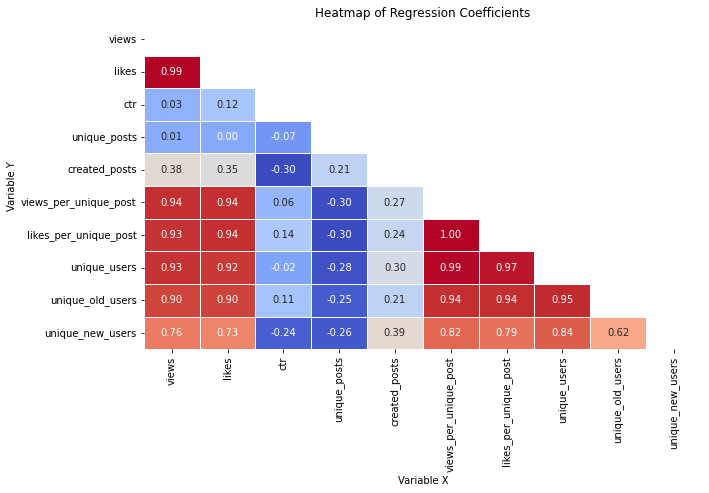

In [23]:
regression_coefficients = activity_metrics.query("hour < '2023-07-14'").drop(['hour', 'hour_type'], axis=1).corr()

# Create a heatmap of the regression coefficients
plt.figure(figsize=(10, 6))

# Create a mask to hide the upper triangle elements
mask = np.triu(m=np.ones_like(regression_coefficients, dtype=bool))

sns.heatmap(regression_coefficients, annot=True, cbar=False, cmap='coolwarm', fmt='.2f', linewidths=0.5, mask=mask)
plt.title('Heatmap of Regression Coefficients')
plt.xlabel('Variable X')
plt.ylabel('Variable Y')
plt.show()

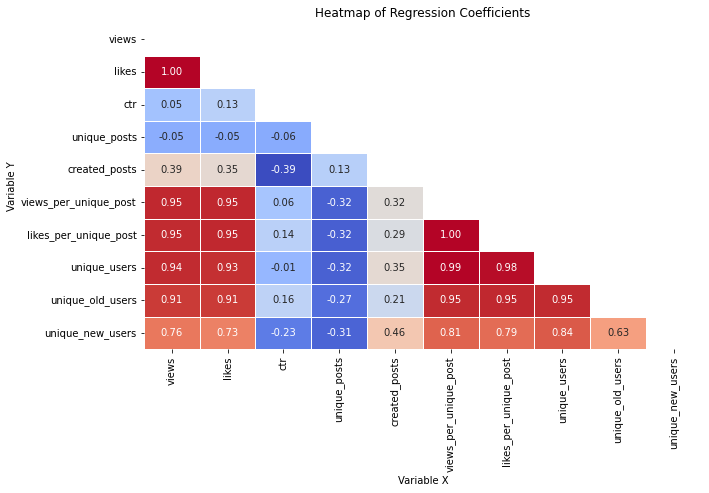

In [24]:
regression_coefficients = activity_metrics.query(
    "hour < '2023-07-14'").drop(['hour', 'hour_type'], axis=1).corr(method="spearman")

# Create a heatmap of the regression coefficients
plt.figure(figsize=(10, 6))

# Create a mask to hide the upper triangle elements
mask = np.triu(m=np.ones_like(regression_coefficients, dtype=bool))

sns.heatmap(regression_coefficients, annot=True, cbar=False, cmap='coolwarm', fmt='.2f', linewidths=0.5, mask=mask)
plt.title('Heatmap of Regression Coefficients')
plt.xlabel('Variable X')
plt.ylabel('Variable Y')
plt.show()

Now have a look at the time series plots and based on both the plots and correlation data, choose regressor metrics.

##### 2.3 Visualizing time series

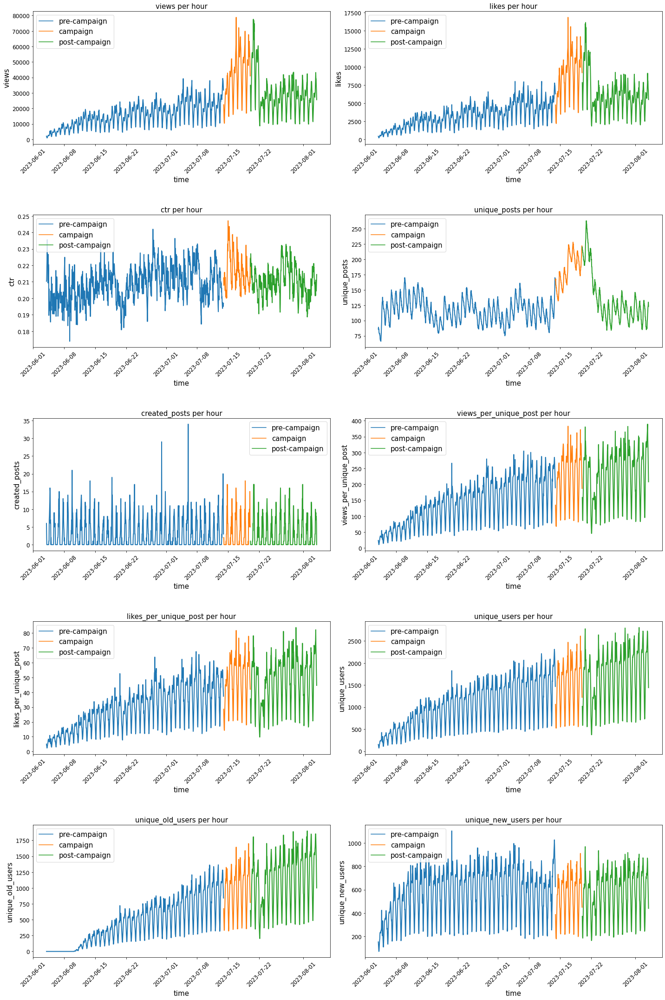

In [16]:
# make a canvas, set sizes
fig, axs = plt.subplots(5, 2, figsize=(20, 30))
for series, ax in zip(list(activity_metrics)[1:-1], axs.reshape(-1)):

    lineplotter(
        data=activity_metrics,
        x='hour',
        y=series,
        ax=ax,
        hue='hour_type',
        title=f'{series} per hour',
        xlabel='time',
        ylabel=f'{series}'
        )

plt.tight_layout(h_pad=5)


**Observations**:  
- views and likes follow the same trend - linear growth with jump during the campaign. For them, we can set Unique Users metric as a regressor - it also grows, but does not have a similar jump.
- no clear trend for CTR, can be a slight increase during the event. As a regressor, try Unique Users first, then Created Posts - it seems to have no growth and correlates the most with CTR (-0.38 to -0.3).
- unique posts - appears to be the biggest jump across the metrics. Try Unique Users as a regressor (anyway, no other metrics would work better here).
- created posts - does not grow (at least by eye) - but test it anyway with the general regressor.
- views and likes per post - follow the same trend as for Unique Users. Try to look at them with this regressor as well.
- unique old users - same trend as for Unique Users.
- unique new users - seems not to grow, but analyze without the regressor anyway.

Next step - decompose our main metrics into the seasonal components: views (likes should be similar), CTR, Unique Users, Unique Posts.

##### 2.4 Time series decomposition: finding seasonality

In [25]:
activity_metrics = activity_metrics.set_index('hour')

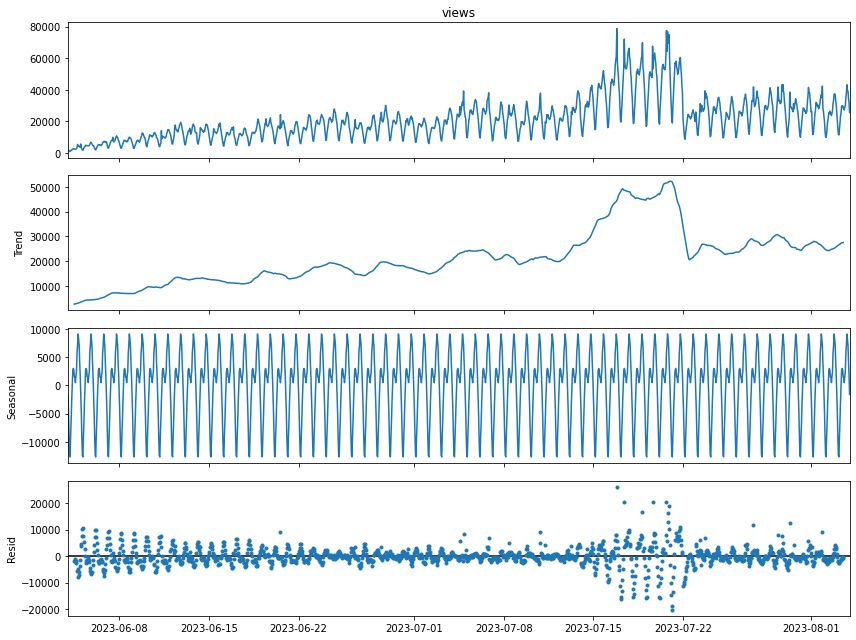

In [18]:
views_decomposed = seasonal_decompose(activity_metrics.views)

decompose_plotter(views_decomposed)

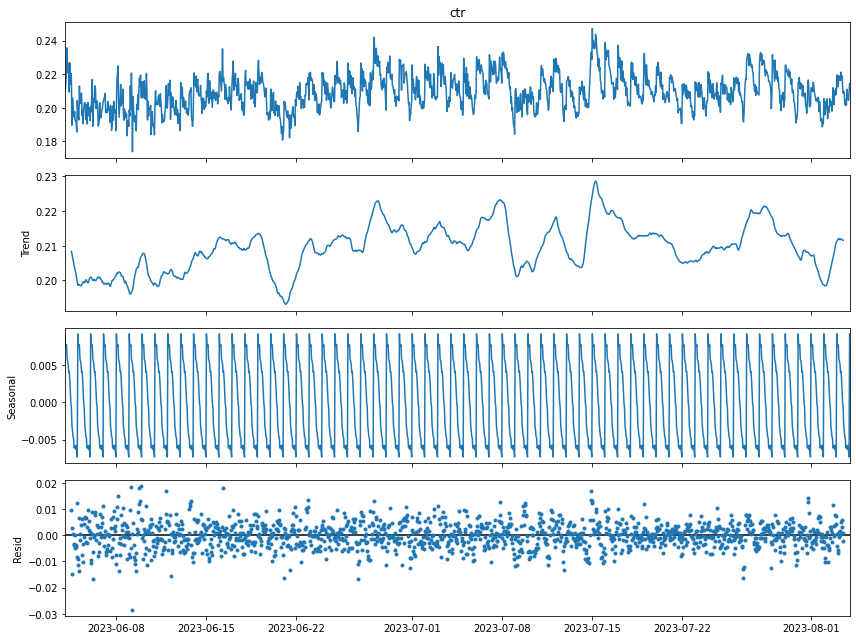

In [19]:
ctr_decomposed = seasonal_decompose(activity_metrics.ctr)

decompose_plotter(ctr_decomposed)


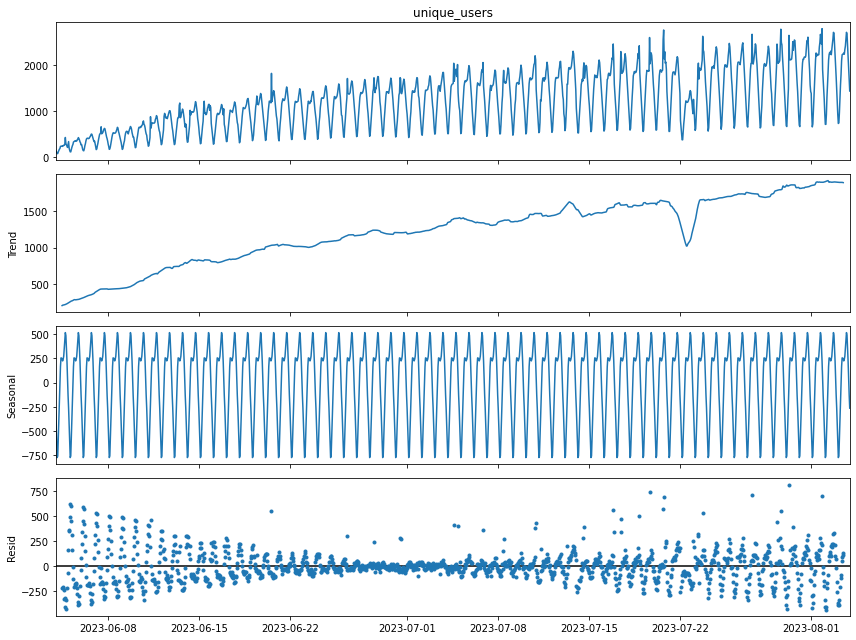

In [20]:
unique_users_decomposed = seasonal_decompose(activity_metrics.unique_users)

decompose_plotter(unique_users_decomposed)


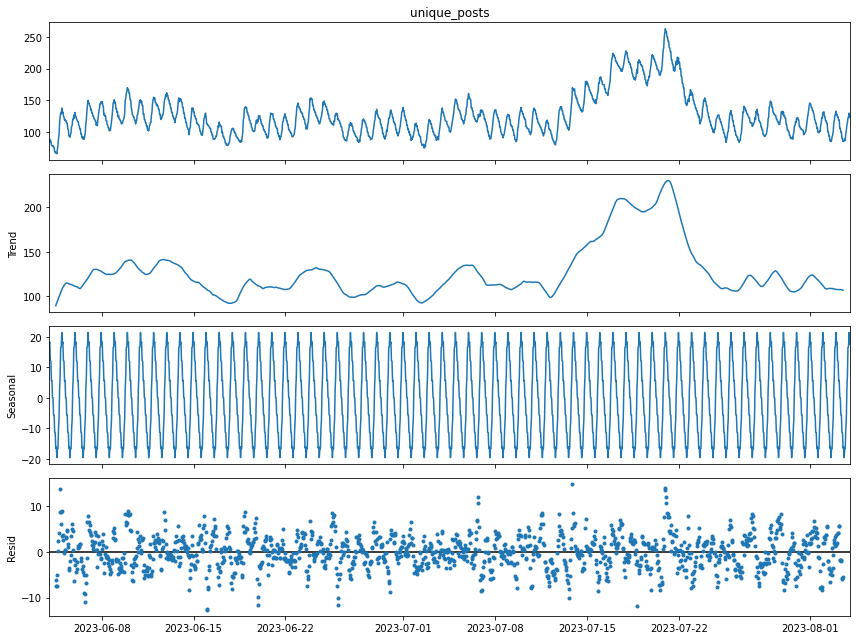

In [21]:
unique_posts_decomposed = seasonal_decompose(activity_metrics.unique_posts)

decompose_plotter(unique_posts_decomposed)


Seasonality is 24 hours here. We will use this information later when using CausalImpact with seasonal parameters.  
Now - look at the retention of the users - it is our last metric to be checked for the impact.

##### 2.5. Retention before and during the campaign

In [22]:
# now make a query with retentions:
# a dataframe where number of active users is aggregated
# across the day and the starting day of the users

start_date = '2023-07-07'
end_date = '2023-07-24'

query = f'''
WITH retained_users AS (
SELECT *
   FROM
     (SELECT user_id,
             min(toDate(time)) AS start_day
      FROM simulator_20230720.feed_actions
      GROUP BY user_id) t1
   JOIN
     (SELECT DISTINCT user_id,
                      toDate(time) AS day
      FROM simulator_20230720.feed_actions) t2 USING user_id
   WHERE (start_day BETWEEN '{start_date}'::DATE AND '{end_date}'::DATE) AND (day != today())
),

retained_users_by_date_source AS (

SELECT toString(start_day) start_day,
       toString(day) day,
       count(user_id) AS users
FROM retained_users
GROUP BY start_day,
         day
)

SELECT start_day,
day,
users,
MAX(users) OVER (PARTITION BY start_day) AS users_start
FROM retained_users_by_date_source
'''

# import the table to a dataframe; convert number of user to float
# to calculate percentage of users relative to their start day
# at the next steps
users_by_start_day = ph.read_clickhouse(
    query, 
    connection=CONNECTION
).astype(
    dtype={'users_start': 'float'}
) 


In [23]:
users_by_start_day.info()
users_by_start_day.head(2)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 405 entries, 0 to 404
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   start_day    405 non-null    object 
 1   day          405 non-null    object 
 2   users        405 non-null    uint64 
 3   users_start  405 non-null    float64
dtypes: float64(1), object(2), uint64(1)
memory usage: 12.8+ KB


,start_day,day,users,users_start
0,2023-07-07,2023-07-10,211,996.0
1,2023-07-07,2023-07-15,169,996.0


In [24]:
# set new columns with percentages  - divide the amount of users by the amount at their starting day
users_by_start_day['retained_percentage'] = users_by_start_day['users'].div(users_by_start_day['users_start']).mul(100)

users_by_start_day.head(2)

,start_day,day,users,users_start,retained_percentage
0,2023-07-07,2023-07-10,211,996.0,21.184739
1,2023-07-07,2023-07-15,169,996.0,16.967871


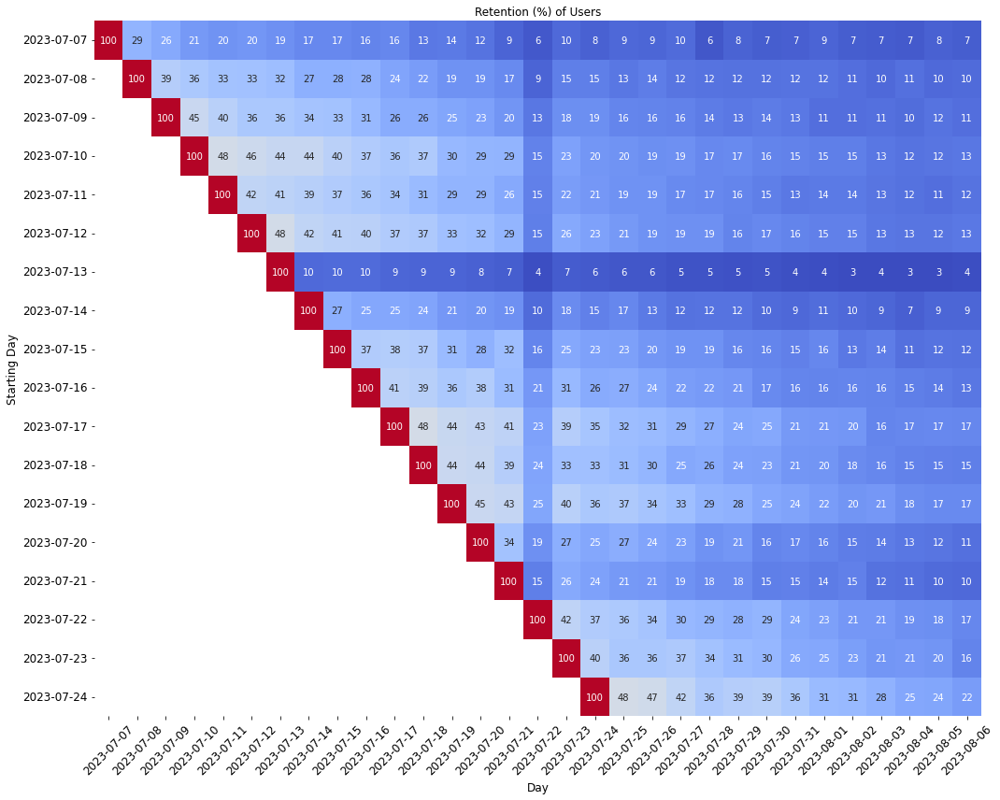

In [25]:
# now, get a heatmap for users retention

# Get a canvas for the plot
fig, ax = plt.subplots(figsize=(15, 12))

# Create a pivot table to reshape the data
pivot_table = users_by_start_day.pivot_table(index='start_day', columns='day', values='retained_percentage')

# Plot the map
heatmapper(
    pivot_table, 
   ax=ax, 
   title='Retention (%) of Users', 
   xlabel='Day',
   ylabel='Starting Day'
)
plt.tight_layout()

No clear ups or downs during the campaign, except less retention of users joining the first and last day of the campaign. However, it is not clear how to analyze this metric with CausalImpact, so we will not go with this further.

#### 3. Impact of the campaign - effect on the metrics
Now to the forecasting: let's first initialize the CausalImpact default 'vi' model without any regressors or seasonality for each of our ten metrics

In [18]:
# define periods before and during the campaign
pre_period = [pd.Timestamp('2023-06-04'), pd.Timestamp('2023-07-13')]
post_period = [pd.to_datetime('2023-07-14'), pd.to_datetime('2023-07-20')]

##### 3.1. Impact without regressors and seasonality
First, make a dictionary with (metric name: CausalImpact model instance for the metric) pairs and then iterate over them: build plots and show the statistics.

In [19]:
modeled_series = {column: CausalImpact(activity_metrics[column], 
                  pre_period, 
                  post_period
                 )
                  for column in list(activity_metrics)[:-1]
                 }


In [20]:
# make an instance of a generator to iterate over column names
gen = column_gen(list(activity_metrics)[:-1])


Now look at the results of modeling for Views metric

In [21]:
column = next(gen)

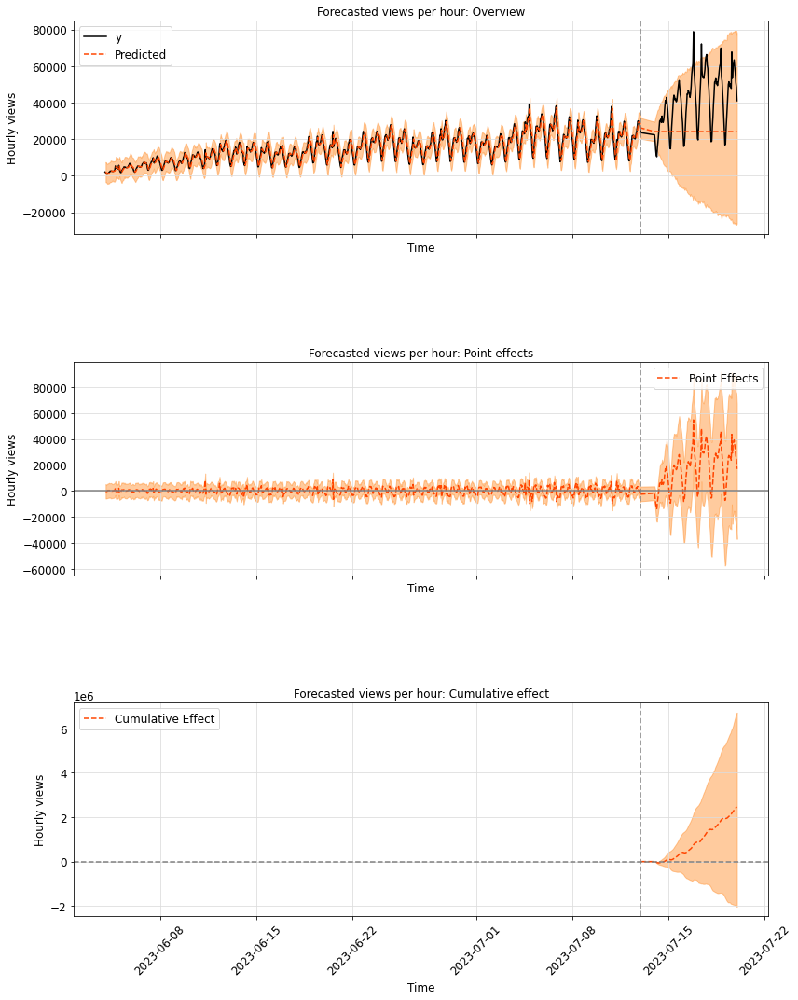

In [22]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

Now look at the results of modeling for Likes

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

Now look at the results of modeling for CTR

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

Now look at the results of modeling for Unique Posts

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

Now look at the results of modeling for Created posts

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

Now look at the results of modeling for Views per unique post

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

Now look at the results of modeling for Likes per unique post

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

Now look at the results of modeling for Unique users

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

Now look at the results of modeling for Unique old users

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

Now look at the results of modeling for Unique new users

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series[column], column)

In [ ]:
print(modeled_series[column].summary())

In [ ]:
print(modeled_series[column].summary('report'))

We are seeing no significant changes (according to the model) in all the metrics and for some of them (e.g. views), predicted confidence intervals are quite broad. The reason can be the lack of regressors in the model.  
We can try adding unique users as a regressor and look at the metrics again (but discard created posts, old/new users as these won't likely show us anything valuable).

##### 3.2. Impact with Unique Users regressor, without seasonality
Now try to to analyse the impact for the selected metrics, but use hourly unique users number as regressor!

In [ ]:
columns = ['views',
 'likes',
 'ctr',
 'unique_posts',
 'views_per_unique_post',
 'likes_per_unique_post',
          ]

gen = column_gen(columns)


In [ ]:
modeled_series_cov = {column: CausalImpact(activity_metrics[[column, 'unique_users']], 
                  pre_period, 
                  post_period
                 )
                  for column in columns
                 }


Look at views

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series_cov[column], f'{column} \n (with Unique User amount as a regressor)')

In [ ]:
print(modeled_series_cov[column].summary())

In [ ]:
print(modeled_series_cov[column].summary('report'))

Look at likes

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series_cov[column], f'{column} \n (with Unique User amount as a regressor)')

In [ ]:
print(modeled_series_cov[column].summary())

In [ ]:
print(modeled_series_cov[column].summary('report'))

Look at CTR

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series_cov[column], f'{column} \n (with Unique User amount as a regressor)')

In [ ]:
print(modeled_series_cov[column].summary())

In [ ]:
print(modeled_series_cov[column].summary('report'))

Look at unique posts

In [ ]:
column = next(gen)

In [ ]:
ci_plotter(modeled_series_cov[column], f'{column} \n (with Unique User amount as a regressor)')

In [ ]:
print(modeled_series_cov[column].summary())

In [ ]:
print(modeled_series_cov[column].summary('report'))

Look at views per unique post

In [ ]:
column = next(gen)

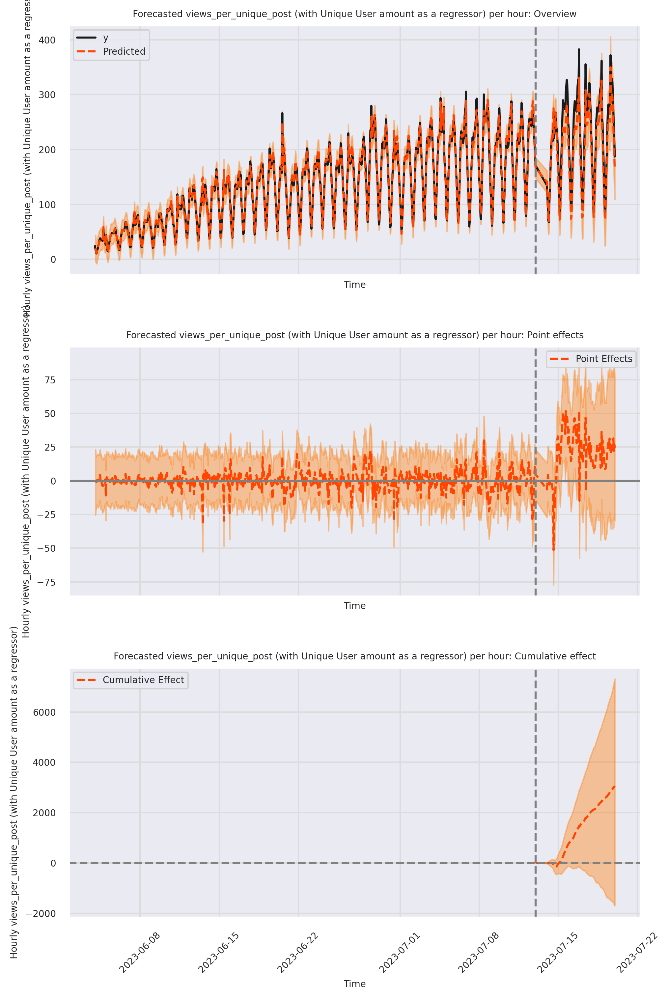

In [82]:
ci_plotter(modeled_series_cov[column], f'{column} \n (with Unique User amount as a regressor)')

In [83]:
print(modeled_series_cov[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    224.85             32602.92
Prediction (s.d.)         203.74 (15.97)     29541.76 (2315.92)
95% CI                    [172.21, 234.81]   [24969.93, 34048.17]

Absolute effect (s.d.)    21.11 (15.97)      3061.16 (2315.92)
95% CI                    [-9.97, 52.64]     [-1445.25, 7632.99]

Relative effect (s.d.)    10.36% (7.84%)     10.36% (7.84%)
95% CI                    [-4.89%, 25.84%]   [-4.89%, 25.84%]

Posterior tail-area probability p: 0.08
Posterior prob. of a causal effect: 91.91%

For more details run the command: print(impact.summary('report'))


In [84]:
print(modeled_series_cov[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 224.85. In the absence of an
intervention, we would have expected an average response of 203.74.
The 95% interval of this counterfactual prediction is [172.21, 234.81].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 21.11 with a 95% interval of
[-9.97, 52.64]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 32602.92.
Had the intervention not taken place, we would have expected
a sum of 29541.76. The 95% interval of this prediction is [24969.93, 34048.17].


The above results are given in terms of absolute numbers. In relative
terms, the response variable showed an i

Look at likes per unique post

In [ ]:
column = next(gen)

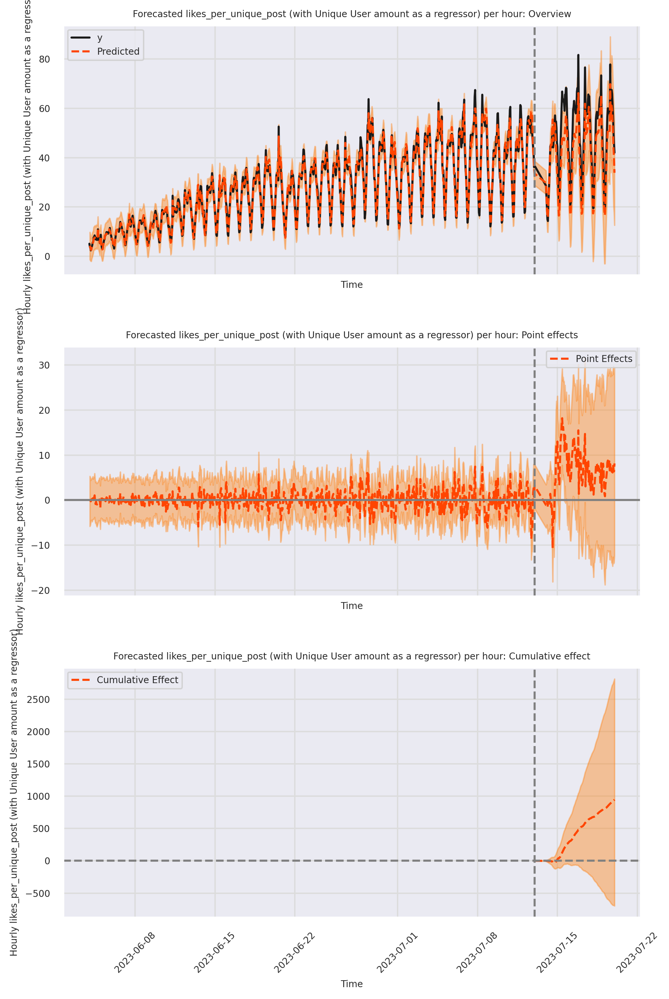

In [85]:
ci_plotter(modeled_series_cov[column], f'{column} (with Unique User amount as a regressor)')

In [86]:
print(modeled_series_cov[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    48.25              6996.26
Prediction (s.d.)         41.72 (6.01)       6049.62 (870.94)
95% CI                    [30.29, 53.84]     [4392.5, 7806.51]

Absolute effect (s.d.)    6.53 (6.01)        946.64 (870.94)
95% CI                    [-5.59, 17.96]     [-810.24, 2603.76]

Relative effect (s.d.)    15.65% (14.4%)     15.65% (14.4%)
95% CI                    [-13.39%, 43.04%]  [-13.39%, 43.04%]

Posterior tail-area probability p: 0.15
Posterior prob. of a causal effect: 85.31%

For more details run the command: print(impact.summary('report'))


In [87]:
print(modeled_series_cov[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 48.25. In the absence of an
intervention, we would have expected an average response of 41.72.
The 95% interval of this counterfactual prediction is [30.29, 53.84].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 6.53 with a 95% interval of
[-5.59, 17.96]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 6996.26.
Had the intervention not taken place, we would have expected
a sum of 6049.62. The 95% interval of this prediction is [4392.5, 7806.51].


The above results are given in terms of absolute numbers. In relative
terms, the response variable showed an increase of

Look at CTR, but try another regressor - created posts - as they have higher correlation.

In [33]:
ctr_cov_created_posts = CausalImpact(activity_metrics[['ctr', 'created_posts']], 
                  pre_period, 
                  post_period
                 )

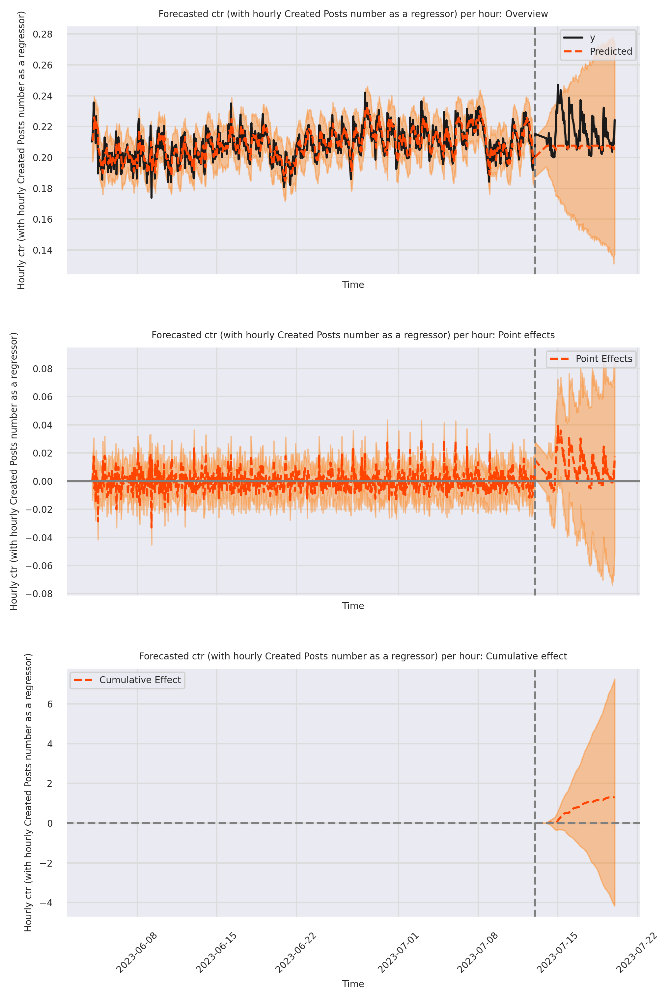

In [34]:
ci_plotter(ctr_cov_created_posts, 'ctr \n (with hourly Created Posts number as a regressor)')

In [35]:
print(ctr_cov_created_posts.summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    0.22               31.36
Prediction (s.d.)         0.21 (0.02)        30.04 (3.11)
95% CI                    [0.17, 0.25]       [24.06, 36.26]

Absolute effect (s.d.)    0.01 (0.02)        1.32 (3.11)
95% CI                    [-0.03, 0.05]      [-4.9, 7.31]

Relative effect (s.d.)    4.4% (10.36%)      4.4% (10.36%)
95% CI                    [-16.3%, 24.32%]   [-16.3%, 24.32%]

Posterior tail-area probability p: 0.32
Posterior prob. of a causal effect: 67.83%

For more details run the command: print(impact.summary('report'))


In [36]:
print(ctr_cov_created_posts.summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 0.22. In the absence of an
intervention, we would have expected an average response of 0.21.
The 95% interval of this counterfactual prediction is [0.17, 0.25].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 0.01 with a 95% interval of
[-0.03, 0.05]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 31.36.
Had the intervention not taken place, we would have expected
a sum of 30.04. The 95% interval of this prediction is [24.06, 36.26].


The above results are given in terms of absolute numbers. In relative
terms, the response variable showed an increase of +4.4%. The 

This model seems to work better, total views and likes show significance and their CI look more narrow. However, we can try adding seasonality at the top here since we know our metrics have it.

##### 3.3. Impact with Unique Users regressor and 24-hr seasonality
Now look at the results of modeling when both regressor and seasonality specified

In [95]:
columns = ['views',
 'likes',
 'ctr',
 'unique_posts',
 'views_per_unique_post',
 'likes_per_unique_post',
          ]

gen = column_gen(columns)


In [89]:
modeled_series_cov_season = {column: CausalImpact(
    activity_metrics[[column, 'unique_users']], 
      pre_period, 
  post_period,
  model_args={'nseasons': 24}
 )
  for column in columns
 }


Look at Views

In [ ]:
column = next(gen)

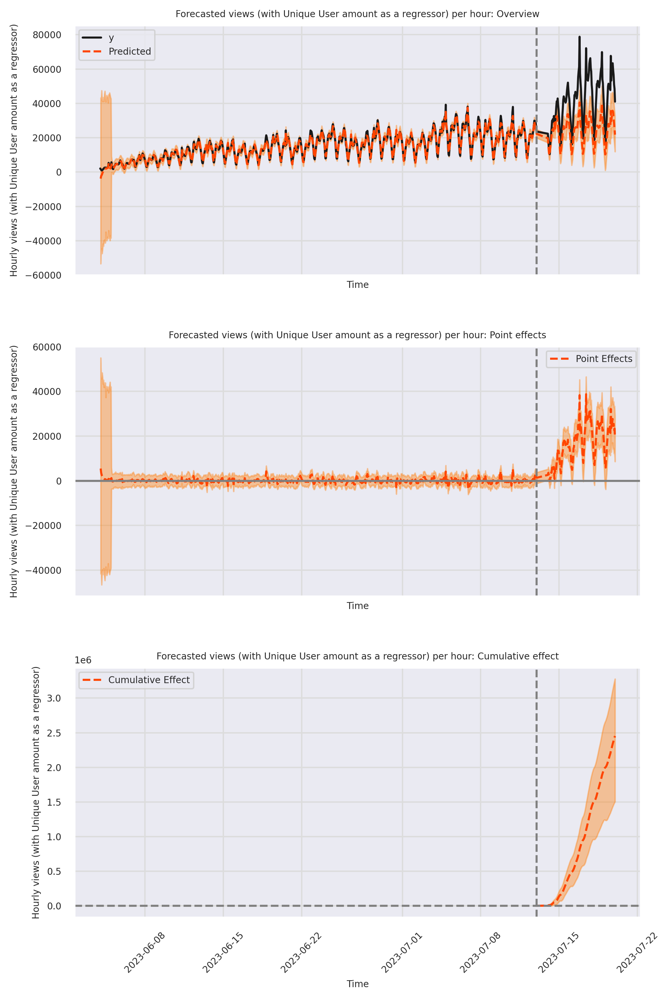

In [96]:
ci_plotter(modeled_series_cov_season[column], f'{column} \n (with Unique User amount as a regressor)')

In [97]:
print(modeled_series_cov_season[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    41079.61           5956543.0
Prediction (s.d.)         24166.46 (3032.45) 3504136.5 (439705.32)
95% CI                    [17999.73, 29886.72][2609961.09, 4333574.62]

Absolute effect (s.d.)    16913.15 (3032.45) 2452406.5 (439705.32)
95% CI                    [11192.88, 23079.87][1622968.38, 3346581.91]

Relative effect (s.d.)    69.99% (12.55%)    69.99% (12.55%)
95% CI                    [46.32%, 95.5%]    [46.32%, 95.5%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))


In [98]:
print(modeled_series_cov_season[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 41079.61. By contrast, in the absence of an
intervention, we would have expected an average response of 24166.46.
The 95% interval of this counterfactual prediction is [17999.73, 29886.72].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 16913.15 with a 95% interval of
[11192.88, 23079.87]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 5956543.0.
By contrast, had the intervention not taken place, we would have expected
a sum of 3504136.5. The 95% interval of this prediction is [2609961.09, 4333574.62].


The above results are given in terms of absolute numbers. In 

Look at Likes

In [ ]:
column = next(gen)

In [99]:
ci_plotter(modeled_series_cov_season[column], f'{column} \n (with Unique User amount as a regressor)')

NameError: name 'modeled_series_cov_season' is not defined

In [100]:
print(modeled_series_cov_season[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    8814.38            1278085.0
Prediction (s.d.)         4973.23 (722.27)   721118.25 (104728.58)
95% CI                    [3512.28, 6343.51] [509281.05, 919809.62]

Absolute effect (s.d.)    3841.15 (722.27)   556966.75 (104728.58)
95% CI                    [2470.86, 5302.1]  [358275.38, 768803.95]

Relative effect (s.d.)    77.24% (14.52%)    77.24% (14.52%)
95% CI                    [49.68%, 106.61%]  [49.68%, 106.61%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))


In [101]:
print(modeled_series_cov_season[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 8814.38. By contrast, in the absence of an
intervention, we would have expected an average response of 4973.23.
The 95% interval of this counterfactual prediction is [3512.28, 6343.51].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 3841.15 with a 95% interval of
[2470.86, 5302.1]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 1278085.0.
By contrast, had the intervention not taken place, we would have expected
a sum of 721118.25. The 95% interval of this prediction is [509281.05, 919809.62].


The above results are given in terms of absolute numbers. In relative
t

Look at CTR

In [ ]:
column = next(gen)

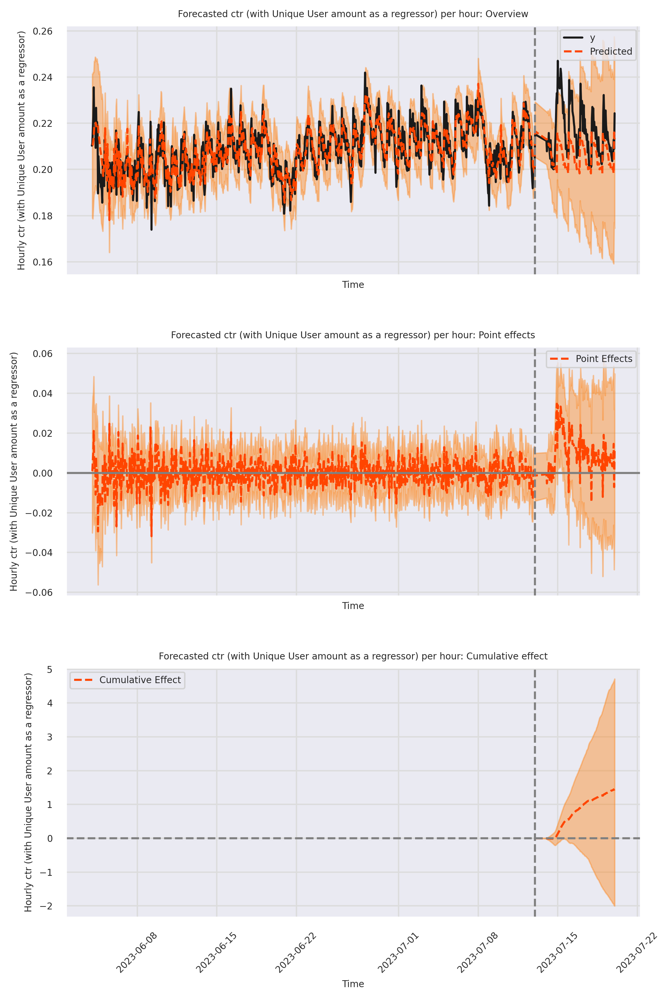

In [102]:
ci_plotter(modeled_series_cov_season[column], f'{column} (with Unique User amount as a regressor)')

In [103]:
print(modeled_series_cov_season[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    0.22               31.36
Prediction (s.d.)         0.21 (0.01)        29.91 (1.85)
95% CI                    [0.18, 0.23]       [26.23, 33.46]

Absolute effect (s.d.)    0.01 (0.01)        1.45 (1.85)
95% CI                    [-0.01, 0.04]      [-2.1, 5.14]

Relative effect (s.d.)    4.85% (6.17%)      4.85% (6.17%)
95% CI                    [-7.02%, 17.17%]   [-7.02%, 17.17%]

Posterior tail-area probability p: 0.21
Posterior prob. of a causal effect: 78.52%

For more details run the command: print(impact.summary('report'))


In [104]:
print(modeled_series_cov_season[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 0.22. In the absence of an
intervention, we would have expected an average response of 0.21.
The 95% interval of this counterfactual prediction is [0.18, 0.23].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 0.01 with a 95% interval of
[-0.01, 0.04]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 31.36.
Had the intervention not taken place, we would have expected
a sum of 29.91. The 95% interval of this prediction is [26.23, 33.46].


The above results are given in terms of absolute numbers. In relative
terms, the response variable showed an increase of +4.85%. The

Look at Unique posts

In [ ]:
column = next(gen)

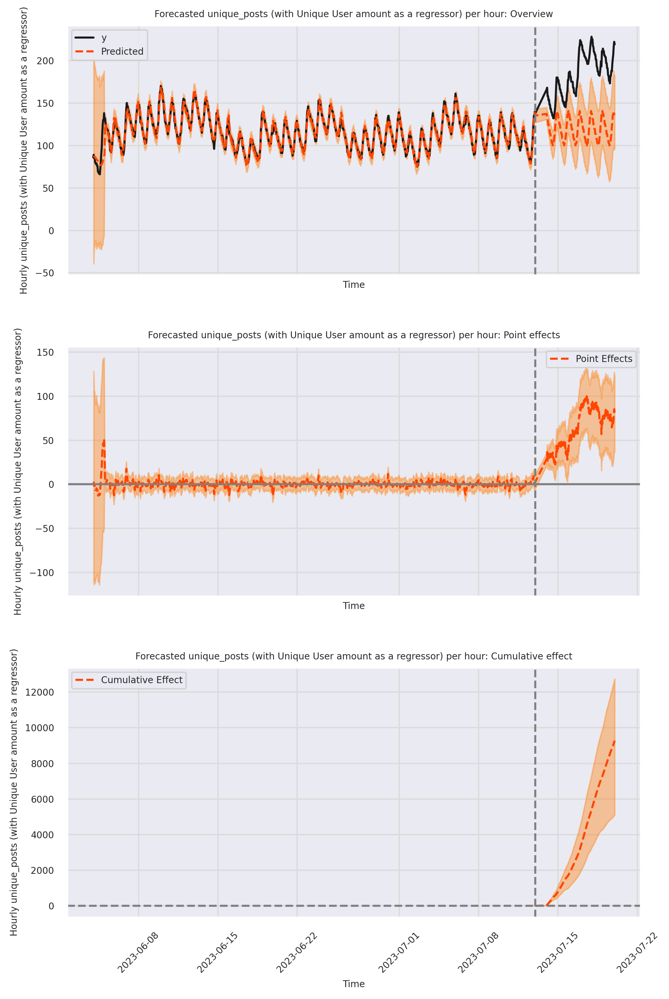

In [105]:
ci_plotter(modeled_series_cov_season[column], f'{column} \n (with Unique User amount as a regressor)')

In [106]:
print(modeled_series_cov_season[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    183.46             26601.0
Prediction (s.d.)         119.48 (12.86)     17323.94 (1865.21)
95% CI                    [92.83, 143.25]    [13459.87, 20771.35]

Absolute effect (s.d.)    63.98 (12.86)      9277.06 (1865.21)
95% CI                    [40.2, 90.63]      [5829.65, 13141.13]

Relative effect (s.d.)    53.55% (10.77%)    53.55% (10.77%)
95% CI                    [33.65%, 75.86%]   [33.65%, 75.86%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))


In [107]:
print(modeled_series_cov_season[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 183.46. By contrast, in the absence of an
intervention, we would have expected an average response of 119.48.
The 95% interval of this counterfactual prediction is [92.83, 143.25].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 63.98 with a 95% interval of
[40.2, 90.63]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 26601.0.
By contrast, had the intervention not taken place, we would have expected
a sum of 17323.94. The 95% interval of this prediction is [13459.87, 20771.35].


The above results are given in terms of absolute numbers. In relative
terms, the respon

Look at Views per unique post

In [ ]:
column = next(gen)

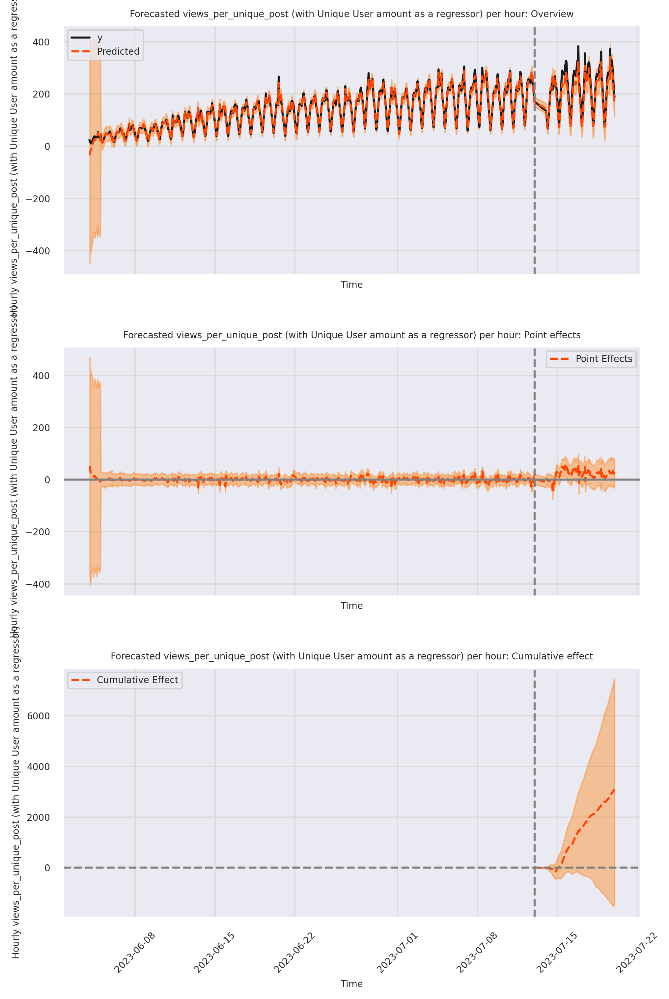

In [108]:
ci_plotter(modeled_series_cov_season[column], f'{column} \n (with Unique User amount as a regressor)')

In [109]:
print(modeled_series_cov_season[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    224.85             32602.92
Prediction (s.d.)         203.55 (16.17)     29514.39 (2345.36)
95% CI                    [172.1, 235.5]     [24954.45, 34148.09]

Absolute effect (s.d.)    21.3 (16.17)       3088.52 (2345.36)
95% CI                    [-10.66, 52.75]    [-1545.18, 7648.46]

Relative effect (s.d.)    10.46% (7.95%)     10.46% (7.95%)
95% CI                    [-5.24%, 25.91%]   [-5.24%, 25.91%]

Posterior tail-area probability p: 0.09
Posterior prob. of a causal effect: 90.51%

For more details run the command: print(impact.summary('report'))


In [110]:
print(modeled_series_cov_season[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 224.85. In the absence of an
intervention, we would have expected an average response of 203.55.
The 95% interval of this counterfactual prediction is [172.1, 235.5].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 21.3 with a 95% interval of
[-10.66, 52.75]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 32602.92.
Had the intervention not taken place, we would have expected
a sum of 29514.39. The 95% interval of this prediction is [24954.45, 34148.09].


The above results are given in terms of absolute numbers. In relative
terms, the response variable showed an inc

Look at Likes per unique post

In [ ]:
column = next(gen)

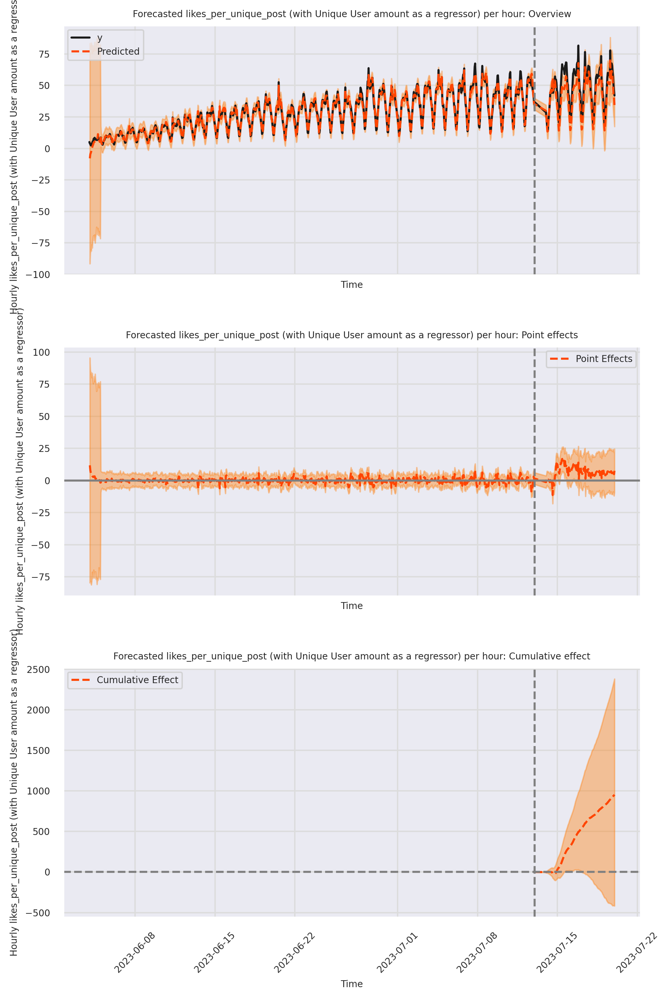

In [111]:
ci_plotter(modeled_series_cov_season[column], f'{column} \n (with Unique User amount as a regressor)')

In [112]:
print(modeled_series_cov_season[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    48.25              6996.26
Prediction (s.d.)         41.68 (5.07)       6043.68 (735.84)
95% CI                    [32.11, 52.0]      [4655.62, 7540.05]

Absolute effect (s.d.)    6.57 (5.07)        952.58 (735.84)
95% CI                    [-3.75, 16.14]     [-543.79, 2340.64]

Relative effect (s.d.)    15.76% (12.18%)    15.76% (12.18%)
95% CI                    [-9.0%, 38.73%]    [-9.0%, 38.73%]

Posterior tail-area probability p: 0.11
Posterior prob. of a causal effect: 89.21%

For more details run the command: print(impact.summary('report'))


In [113]:
print(modeled_series_cov_season[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 48.25. In the absence of an
intervention, we would have expected an average response of 41.68.
The 95% interval of this counterfactual prediction is [32.11, 52.0].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 6.57 with a 95% interval of
[-3.75, 16.14]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 6996.26.
Had the intervention not taken place, we would have expected
a sum of 6043.68. The 95% interval of this prediction is [4655.62, 7540.05].


The above results are given in terms of absolute numbers. In relative
terms, the response variable showed an increase of

Look at CTR, but with Created posts as a regressor

In [37]:
ctr_cov_created_posts_season = CausalImpact(activity_metrics[['ctr', 'created_posts']], 
                                              pre_period, 
                                              post_period,
                                            model_args={'nseasons': 24}
                                           )


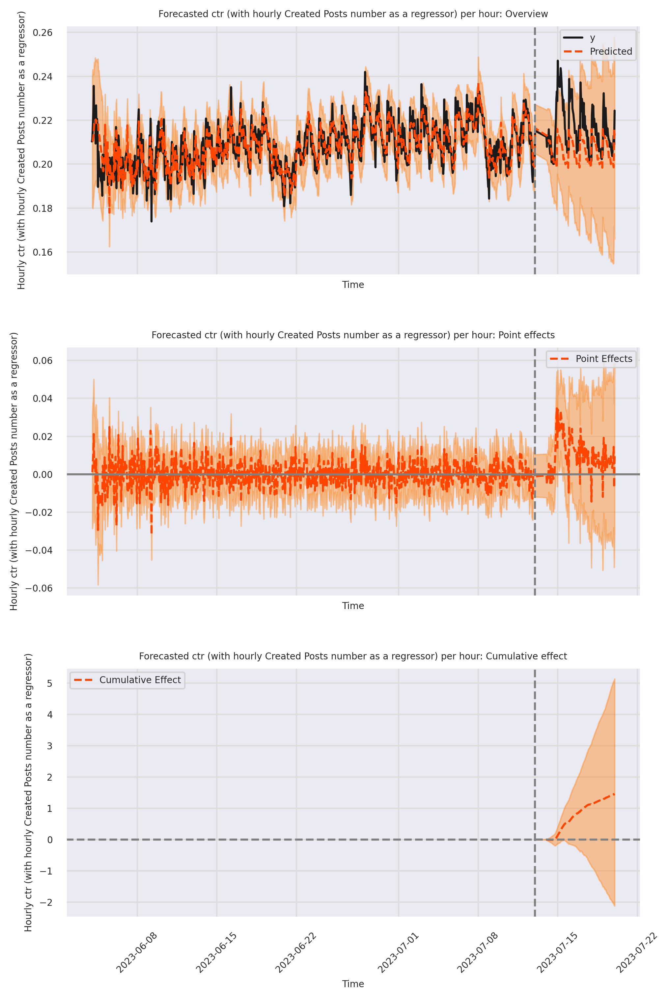

In [38]:
ci_plotter(ctr_cov_created_posts_season, 'ctr \n (with hourly Created Posts number as a regressor)')

In [39]:
print(ctr_cov_created_posts_season.summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    0.22               31.36
Prediction (s.d.)         0.21 (0.01)        29.91 (1.83)
95% CI                    [0.18, 0.23]       [26.35, 33.53]

Absolute effect (s.d.)    0.01 (0.01)        1.45 (1.83)
95% CI                    [-0.01, 0.03]      [-2.17, 5.02]

Relative effect (s.d.)    4.86% (6.13%)      4.86% (6.13%)
95% CI                    [-7.24%, 16.78%]   [-7.24%, 16.78%]

Posterior tail-area probability p: 0.23
Posterior prob. of a causal effect: 77.12%

For more details run the command: print(impact.summary('report'))


In [40]:
print(ctr_cov_created_posts_season.summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 0.22. In the absence of an
intervention, we would have expected an average response of 0.21.
The 95% interval of this counterfactual prediction is [0.18, 0.23].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 0.01 with a 95% interval of
[-0.01, 0.03]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 31.36.
Had the intervention not taken place, we would have expected
a sum of 29.91. The 95% interval of this prediction is [26.35, 33.53].


The above results are given in terms of absolute numbers. In relative
terms, the response variable showed an increase of +4.86%. The

##### 3.4. Summary

Let's summarize our results (average values of a metric) in a table and discuss them.

In [36]:


data = {
    "Metric": [
        "Views", "Likes", "CTR", "CTR (created posts regressor)",
        "Unique posts", "Created posts", "Views per unique post",
        "Likes per unique post", "Unique users", "Unique old users", "Unique new users"
    ],
    "No Regressor, No Seasonality - Actual": [41079, 8814, 0.22, "na", 183, 3.15, 224, 48, 1525, 974, 551],
    "No Regressor, No Seasonality - Prediction": [24118, 5116, 0.21, "na", 138, 3.01, 175, 37, 1283, 747, 553],
    "No Regressor, No Seasonality - p-value": [0.14, 0.13, 0.32, "na", 0.1, 0.42, 0.33, 0.34, 0.42, 0.32, 0.49],
    "Regressor, No Seasonality - Actual": [41079, 8814, 0.22, 0.22, 183, "na", 224, 48, "na", "na", "na"],
    "Regressor, No Seasonality - Prediction": [27748, 5715, 0.2, 0.21, 136, "na", 203, 42, "na", "na", "na"],
    "Regressor, No Seasonality - p-value": [0.01, 0.02, 0.24, 0.32, 0.09, "na", 0.08, 0.15, "na", "na", "na"],
    "Regressor, Seasonality - Actual": [41079, 8814, 0.22, 0.22, 183, "na", 224, 48, "na", "na", "na"],
    "Regressor, Seasonality - Prediction": [24166, 4973, 0.21, 0.21, 120, "na", 203, 41, "na", "na", "na"],
    "Regressor, Seasonality - p-value": [0, 0, 0.21, 0.23, 0, "na", 0.09, 0.11, "na", "na", "na"]
}

df = pd.DataFrame(data)
df.replace('na', float('nan'), inplace=True)

df


,Metric,"No Regressor, No Seasonality - Actual","No Regressor, No Seasonality - Prediction","No Regressor, No Seasonality - p-value","Regressor, No Seasonality - Actual","Regressor, No Seasonality - Prediction","Regressor, No Seasonality - p-value","Regressor, Seasonality - Actual","Regressor, Seasonality - Prediction","Regressor, Seasonality - p-value"
0,Views,41079.00,24118.00,0.14,41079.00,27748.00,0.01,41079.00,24166.00,0.00
1,Likes,8814.00,5116.00,0.13,8814.00,5715.00,0.02,8814.00,4973.00,0.00
2,CTR,0.22,0.21,0.32,0.22,0.20,0.24,0.22,0.21,0.21
3,CTR (created posts regressor),NaN,NaN,NaN,0.22,0.21,0.32,0.22,0.21,0.23
4,Unique posts,183.00,138.00,0.10,183.00,136.00,0.09,183.00,120.00,0.00
5,Created posts,3.15,3.01,0.42,NaN,NaN,NaN,NaN,NaN,NaN
6,Views per unique post,224.00,175.00,0.33,224.00,203.00,0.08,224.00,203.00,0.09
7,Likes per unique post,48.00,37.00,0.34,48.00,42.00,0.15,48.00,41.00,0.11
8,Unique users,1525.00,1283.00,0.42,NaN,NaN,NaN,NaN,NaN,NaN
9,Unique old users,974.00,747.00,0.32,NaN,NaN,NaN,NaN,NaN,NaN


Results and discussion:
1. During the campaign, views and likes have indeed increased due to the event, gaining roughly 70% in value. Using appropriate regressor and known seasonality helped to narrow down prediction CI (and decrease p-values).
2. CTR, one of our most important metrics, did not show statistically significant difference in value regardless of a method used (regressors, seasonality), likely because of the uniform increase in views and likes.
3. Unique posts, even though not following the same trend as the regressor, showed significant difference due to the event (50% increase) when applied both Unique users regressor and seasonality.
4. The quality of posts, expressed as likes and views per post, did not change at the model parameters tested. It can be that the growth in total views and likes were caused not by the higher quality of the posts, but their amount (number of unique posts). Interestingly, number of created posts was kept essentially the same without changes, indicating that the only source of increased posts were old posts appearing in the feed more 'dense'.
5. The amount of active users (both old and new ones) was the same, indicating that the campaign a) did not stimulate 'grey' inactive users and b) did not lead to influx of 'fresh' users.

Discussion and conclusion:
1. We can conclude that the event indeed had a positive effect on both views and likes, causing significant increase in both metrics. Number of posts viewed hourly has also increased ('variability' of posts in the feed).
2. CTR, however, did not see a similar change, as well as quality of the posts (likes and views per post) or amount of users using the feed.

#### 4. Long-term impact on likes and unique posts
Now that we now that among models tested, using Unique User amount as a regressor and using 24-hr seasonality gives better results, let's see if the impact on the metrics imposed by the campaign had long-term effects.  
In other words, we would like to see if after the campaign, the pattern of the metrics has changed compared to pre-campaign period.  
The metrics we analyze here are likes and unique posts since they had strongest response during the campaign which was statistically significant.

First, we get an updated dataset with more post-campaign dates for more representative time series.

##### 4.1. Quering and formatting

In [42]:
# get a table with the acitivty metrics
# for the whole period
# grouped by hour

start_date = '2023-06-04'

query = f'''
SELECT
    hour,
    countIf(action = 'view') AS views,
    countIf(action = 'like') AS likes,
    likes / views as ctr,
    countDistinct(post_id) AS unique_posts,
    countIfDistinctOrNull(post_id, hour = toStartOfHour(created_hour)) AS created_posts,
    views / unique_posts AS views_per_unique_post,
    likes / unique_posts AS likes_per_unique_post,
    countDistinct(user_id) AS unique_users,
    countIfDistinctOrNull(user_id, toStartOfHour(user_start_date) <= date_sub(DAY, 7, hour)) AS unique_old_users,
    countIfDistinctOrNull(user_id, toStartOfHour(user_start_date) > date_sub(DAY, 7, hour)) AS unique_new_users
FROM
    (SELECT
    toStartOfHour(time) AS hour,
    action,
    post_id,
    min(time) OVER (PARTITION BY post_id) AS created_hour,
    user_id,
    min(time) OVER (PARTITION BY user_id) AS user_start_date
    FROM simulator_20230720.feed_actions) feed_actions_post_creation_date
WHERE hour BETWEEN '{start_date}'::DATE AND today()
GROUP BY hour
ORDER BY hour ASC
'''

# import a table to a dataframe
activity_metrics = ph.read_clickhouse(
    query, 
    connection=CONNECTION
)


In [43]:
# add a new column where for each hour,
# we have classifications: 
# pre-campaign, campaign, post-campaign
activity_metrics['hour_type'] = activity_metrics['hour'].swifter.apply(lambda time: 'pre-campaign' if time < pd.to_datetime('2023-07-14')
                                                                              else 'campaign' if time <= pd.to_datetime('2023-07-20')
                                                                              else 'post-campaign')

Dask Apply:   0%|          | 0/16 [00:00<?, ?it/s]

In [44]:
activity_metrics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1513 entries, 0 to 1512
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   hour                   1513 non-null   datetime64[ns]
 1   views                  1513 non-null   uint64        
 2   likes                  1513 non-null   uint64        
 3   ctr                    1513 non-null   float64       
 4   unique_posts           1513 non-null   uint64        
 5   created_posts          1513 non-null   uint64        
 6   views_per_unique_post  1513 non-null   float64       
 7   likes_per_unique_post  1513 non-null   float64       
 8   unique_users           1513 non-null   uint64        
 9   unique_old_users       1513 non-null   uint64        
 10  unique_new_users       1513 non-null   uint64        
 11  hour_type              1513 non-null   object        
dtypes: datetime64[ns](1), float64(3), object(1), uint64(7)
memory 

In [45]:
activity_metrics.iloc[::-1].head(3)

,hour,views,likes,ctr,unique_posts,created_posts,views_per_unique_post,likes_per_unique_post,unique_users,unique_old_users,unique_new_users,hour_type
1512,2023-08-06 00:00:00,29329,6722,0.229193,145,1,202.268966,46.358621,1398,978,420,post-campaign
1511,2023-08-05 23:00:00,36473,7569,0.207523,151,5,241.543046,50.125828,1702,1215,487,post-campaign
1510,2023-08-05 22:00:00,39839,8340,0.209343,146,8,272.869863,57.123288,1938,1358,580,post-campaign


In [48]:
activity_metrics = activity_metrics.set_index('hour')

##### 4.2. Long-term impact with Unique Users regressor and 24-hr seasonality

In [56]:
# define periods before and during + after the campaign
first_date = pd.to_datetime(np.min(activity_metrics.index.values))
last_date = pd.to_datetime(np.max(activity_metrics.index.values))

pre_period = [first_date, pd.Timestamp('2023-07-13')]
post_period = [pd.to_datetime('2023-07-14'), last_date]

In [64]:
columns = ['likes',
             'unique_posts'
          ]

gen = column_gen(columns)


In [58]:
modeled_series_cov_season_long_term = {column: CausalImpact(
    activity_metrics[[column, 'unique_users']], 
      pre_period, 
  post_period,
  model_args={'nseasons': 24}
 )
  for column in columns
 }


In [ ]:
column = next(gen)

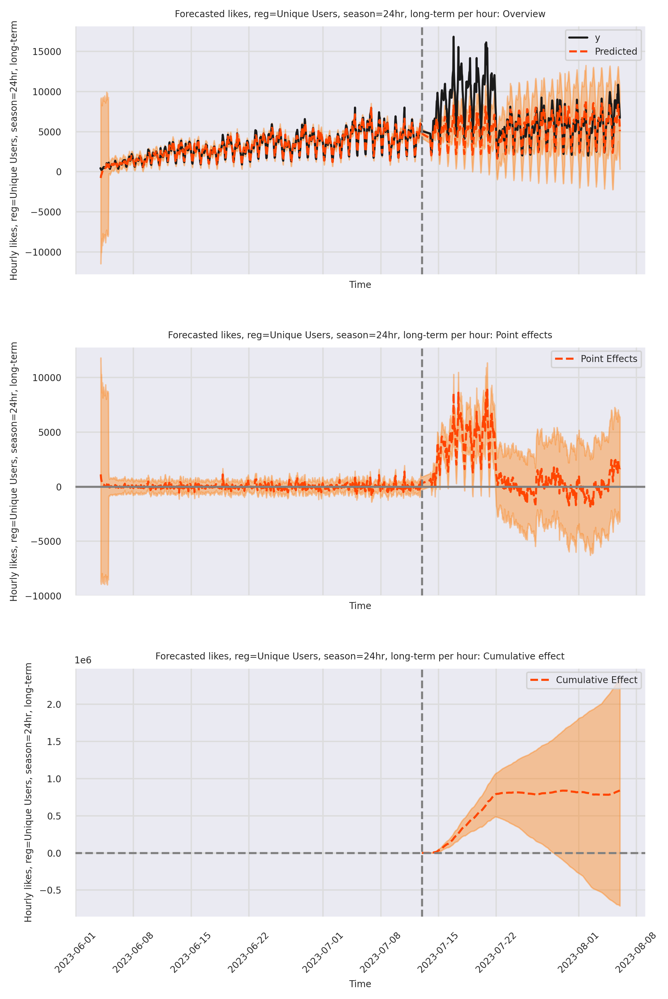

In [65]:
ci_plotter(modeled_series_cov_season_long_term[column], f'{column}, reg=Unique Users, season=24hr, long-term')

In [66]:
print(modeled_series_cov_season_long_term[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    6858.17            3792568.0
Prediction (s.d.)         5339.07 (1401.51)  2952508.25 (775032.7)
95% CI                    [2577.14, 8070.95] [1425160.6, 4463233.59]

Absolute effect (s.d.)    1519.1 (1401.51)   840059.75 (775032.7)
95% CI                    [-1212.78, 4281.03][-670665.59, 2367407.4]

Relative effect (s.d.)    28.45% (26.25%)    28.45% (26.25%)
95% CI                    [-22.72%, 80.18%]  [-22.72%, 80.18%]

Posterior tail-area probability p: 0.15
Posterior prob. of a causal effect: 85.01%

For more details run the command: print(impact.summary('report'))


In [67]:
print(modeled_series_cov_season_long_term[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 6858.17. In the absence of an
intervention, we would have expected an average response of 5339.07.
The 95% interval of this counterfactual prediction is [2577.14, 8070.95].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 1519.1 with a 95% interval of
[-1212.78, 4281.03]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 3792568.0.
Had the intervention not taken place, we would have expected
a sum of 2952508.25. The 95% interval of this prediction is [1425160.6, 4463233.59].


The above results are given in terms of absolute numbers. In relative
terms, the response vari

In [ ]:
column = next(gen)

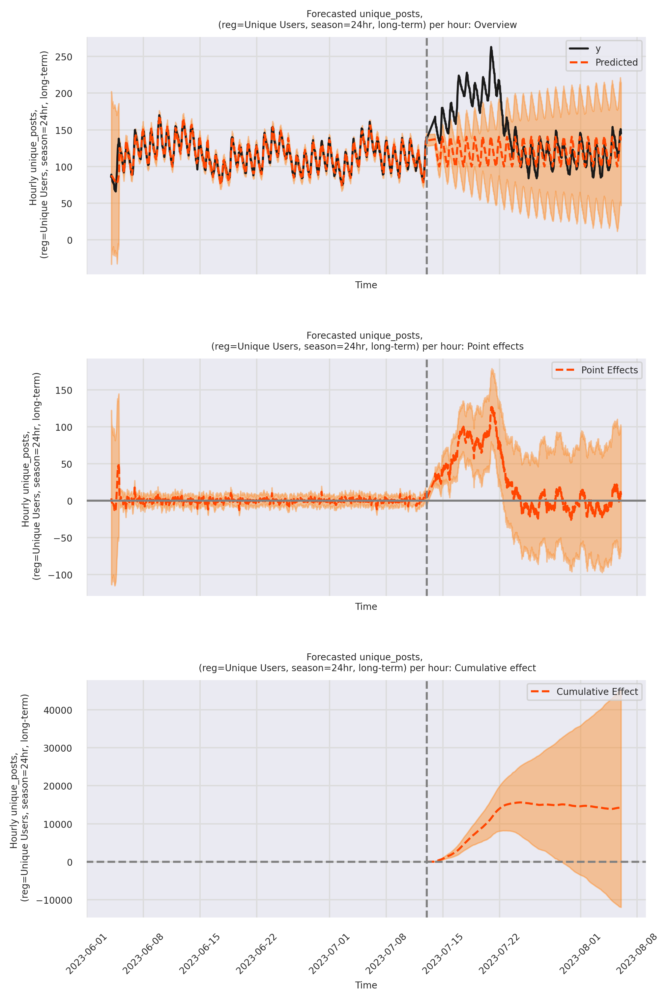

In [81]:
ci_plotter(modeled_series_cov_season_long_term[column], f'{column}, \n (reg=Unique Users, season=24hr, long-term)')

In [69]:
print(modeled_series_cov_season_long_term[column].summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    145.13             80258.0
Prediction (s.d.)         119.39 (25.72)     66024.59 (14224.48)
95% CI                    [69.18, 170.01]    [38256.21, 94015.15]

Absolute effect (s.d.)    25.74 (25.72)      14233.41 (14224.48)
95% CI                    [-24.88, 75.95]    [-13757.15, 42001.79]

Relative effect (s.d.)    21.56% (21.54%)    21.56% (21.54%)
95% CI                    [-20.84%, 63.62%]  [-20.84%, 63.62%]

Posterior tail-area probability p: 0.15
Posterior prob. of a causal effect: 85.11%

For more details run the command: print(impact.summary('report'))


In [70]:
print(modeled_series_cov_season_long_term[column].summary('report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 145.13. In the absence of an
intervention, we would have expected an average response of 119.39.
The 95% interval of this counterfactual prediction is [69.18, 170.01].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 25.74 with a 95% interval of
[-24.88, 75.95]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 80258.0.
Had the intervention not taken place, we would have expected
a sum of 66024.59. The 95% interval of this prediction is [38256.21, 94015.15].


The above results are given in terms of absolute numbers. In relative
terms, the response variable showed an in

##### 4.3. Summary

Results and discussion:
- As we can see, the intervention (the campaign) did not have any long-term effects on likes or number of unique posts viewed: after the campagin, the actual metric values accurately follow the predicted line ('after' state is not different from 'before' state). It is likely that views did follow the same pattern as well.

#### 5. Questions

- Did I choose enough metrics, what would you recommend to look at?
- Is it really possible that such campaign does not increase number of new posts created per hour?


#### 6. Notes to myself

To read:
- https://towardsdatascience.com/implementing-causal-impact-on-top-of-tensorflow-probability-c837ea18b126
- https://github.com/WillianFuks/tfcausalimpact/tree/master/notebooks

To add:
- Try other models as well